In [1]:
import os
os.environ["STPSF_PATH"] = '../stpsf-data'
os.environ["STPSF_EXT_PATH"] = '../stpsf-data'
os.environ["PYSYN_CDBS"] = "../cdbs"

from astropy.io import fits

import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np

import os
os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '0.3'

jax.config.update("jax_enable_x64", True)
jax.config.update("jax_debug_nans", True)

#### Loading Files

In [2]:
import sys
sys.path.append('..')

### Processing Fits File

/home/mihirkondapalli/anaconda3/envs/jwst_env/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


  Setting WEBBPSF_EXT_PATH to STPSF_PATH directory:
  ../stpsf-data
webbpsf_ext log messages of level WARN and above will be shown.
webbpsf_ext log outputs will be directed to the screen.
Could not import CuPy. Setting: use_gpu=False (i.e., using CPU operations).
Filename: ../test_images/jw04050015001_03106_00001_nrca2_calints.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       113   (320, 320, 1)   float32   
  2  ERR           1 ImageHDU        11   (320, 320, 1)   float64   
  3  DQ            1 ImageHDU        12   (320, 320, 1)   int32 (rescales to uint32)   
  4  AREA          1 ImageHDU         9   (320, 320)   float32   
  5  INT_TIMES     1 BinTableHDU     24   5R x 7C   [J, D, D, D, D, D, D]   
  6  VAR_POISSON    1 ImageHDU        10   (320, 320, 5)   float32   
  7  VAR_RNOISE    1 ImageHDU        10   (320, 320, 5)   float32   
  8  VAR_FLAT      1 ImageHDU        10   (32

Text(0.5, 1.0, 'Image from Fits File')

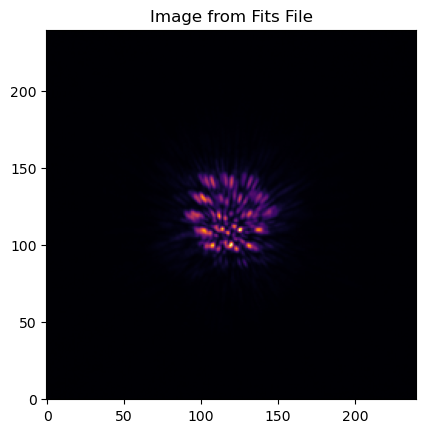

In [3]:
from optimization.optimize_framework import OptimizeUtils

fits_image_filepath = "../test_images/" + 'jw04050015001_03106_00001_nrca2_calints' + ".fits"
hdul = fits.open(fits_image_filepath)

#Displays File Info
hdul.info()

# Gets Image
target_image = OptimizeUtils.process_image(hdul['SCI'].data[0], bounds=(40, 280, 40, 280))

# Displays Image
plt.imshow(target_image, origin='lower', cmap='inferno')
plt.title("Image from Fits File")

### Creating WebbPSF NICRAM Object

## Getting Optimal Disk Fit

In [4]:
from optimization.optimize_framework import Optimizer, OptimizeUtils
from disk_model.objective_functions import objective_model, objective_ll, objective_fit, Parameter_Index
from disk_model.SLD_ojax import ScatteredLightDisk
from disk_model.SLD_utils import *

### Getting Optimal Fit

In [5]:

target_image = OptimizeUtils.process_image(hdul['SCI'].data[0], bounds=(40, 280, 40, 280))
err_map = OptimizeUtils.process_image(OptimizeUtils.create_empirical_err_map(hdul['ERR'].data[0]), bounds=(40, 280, 40, 280)) #, outlier_pixels=[(57, 68)]))

In [6]:
folder = "../stellar_psf_images/"
fits_files = [f for f in os.listdir(folder) if f.endswith(".fits")]
image_list = []
for fname in fits_files:
    path = os.path.join(folder, fname)
    with fits.open(path) as hdul_stellar:
        sci_data = hdul_stellar['SCI'].data[0]  # shape (H, W)
        image_list.append(OptimizeUtils.process_image(sci_data, bounds=(40, 280, 40, 280)))
image_stack_np = np.stack(image_list)  # shape (N, H, W)
image_stack_jax = jnp.array(image_stack_np)  # shape (N, H, W)

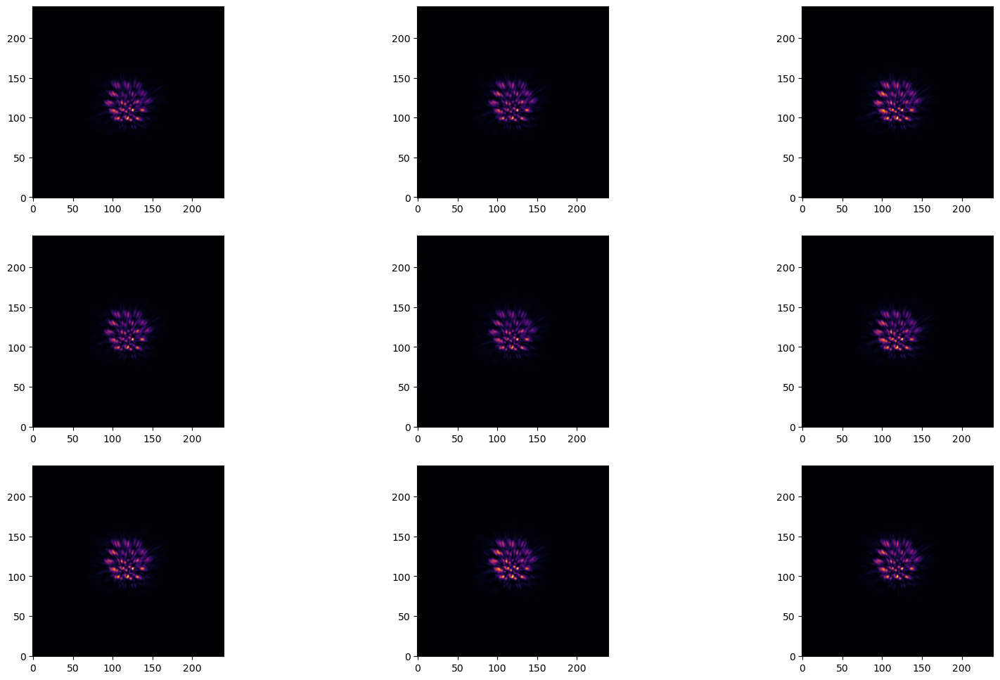

In [7]:
fig, axes = plt.subplots(len(image_stack_jax)//3, 3, figsize=(20, 12))
for i in range(0, len(image_stack_jax)):
    axes[i//3][i%3].imshow(image_stack_jax[i], origin='lower', cmap='inferno')

In [8]:
from disk_model.winnie_jwst_fm import generate_nircam_psf_grid
import numpy as np
import webbpsf_ext

# 1. Star center in aligned image (shifted to nominal coronagraph center)
cent = np.array([120, 120])

# 2. No offset between star and coronagraph center for each roll
dc_rolls = np.array([[0, 0], [0, 0]])
c_coron_rolls = cent + dc_rolls  # Final per-roll star positions (pixels)

# 3. PSF grid settings
fov_pix = 153            # Field of view in detector pixels
osamp = 2                # PSF oversampling factor
source_spectrum = None   # Flat spectrum (default stellar)

# 4. Define the NIRCam instrument
inst = webbpsf_ext.NIRCam_ext(
    fov_pix=fov_pix,
    oversample=osamp,
    filter='F200W',
    pupil_mask='MASK210R',
    module='A',
    channel='SHORT',
    detector='NRCA2'
)

# 5. Set optical path differences and pupil misalignments
inst.options['pupil_shift_x'] = -0.012
inst.options['pupil_shift_y'] = -0.008
inst.options['defocus_waves'] = -0.00865
inst.options['pupil_rotation'] = -0.595

# 6. Precompute interpolation coefficients for faster PSF generation
inst.gen_psf_coeff()
inst.gen_wfemask_coeff(large_grid=True)

# 7. Generate PSF grid
print("Generating PSFs...")
psfs, psf_inds_rolls, im_mask_rolls, psf_offsets = generate_nircam_psf_grid(
    inst,
    c_coron_rolls,
    source_spectrum=source_spectrum,
    normalize=True,
    log_rscale=True,
    nr=5,
    rmax=10**0.5,
    ntheta=4,
    use_coeff=True
)

# 8. Store in a list if desired
nircam_psf_list_ex = [psfs, psf_inds_rolls, im_mask_rolls, psf_offsets]


Generating PSFs...


In [9]:
from disk_model.SLD_utils import Winnie_PSF

psfs, psf_inds_rolls, im_mask_rolls, psf_offsets = nircam_psf_list_ex
test_parangs = [0.]
n_unique_inds = len(jnp.unique(psf_inds_rolls))

psf_params_F200M = Winnie_PSF.init(psfs, psf_inds_rolls, im_mask_rolls, psf_offsets, test_parangs, n_unique_inds)

In [10]:
start_disk_params = Parameter_Index.disk_params.copy()
start_spf_params = InterpolatedUnivariateSpline_SPF.params.copy()
start_psf_params = psf_params_F200M
start_stellar_psf_params = PositionalStellarPSF.params.copy()
start_misc_params = Parameter_Index.misc_params.copy()

start_disk_params['sma'] = 70.12
start_disk_params['inclination'] = 72.40
start_disk_params['position_angle'] = 133.22
start_disk_params['alpha_in'] = 11.99
start_disk_params['alpha_out'] = -4.25
start_disk_params['gamma'] = 1.11

start_spf_params['num_knots'] = 7 # int(row["Knots"])
start_spf_params['knot_values'] = 1e-8 * OptimizeUtils.convert_dhg_params_to_spline_params(0.83, -0.73, 0.94, start_spf_params)

start_stellar_psf_params['stellar_weights'] = 0.004*jnp.ones(len(image_stack_jax))
start_stellar_psf_params['stellar_xs'] = 120*jnp.ones(len(image_stack_jax))
start_stellar_psf_params['stellar_ys'] = 120*jnp.ones(len(image_stack_jax))

start_misc_params['nx'] = 240
start_misc_params['ny'] = 240
start_misc_params['distance'] = 80.2066
start_misc_params['pxInArcsec'] = 0.032

start_disk_params['x_center'] = start_misc_params['nx']/2
start_disk_params['y_center'] = start_misc_params['ny']/2

opt = Optimizer(start_disk_params, start_spf_params, start_psf_params, start_misc_params, ScatteredLightDisk, DustEllipticalDistribution2PowerLaws,
                InterpolatedUnivariateSpline_SPF, Winnie_PSF, StellarPSFModel=PositionalStellarPSF, stellar_psf_params=start_stellar_psf_params)

opt.define_reference_images(image_stack_jax)
opt.inc_bound_knots() # call this method only if you have a good predifined inclination, otherwise don't use it
opt.scale_initial_knots(target_image-opt.computer_stellar_psf_image())

print(opt.log_likelihood(target_image, err_map))

-47084898.848282605


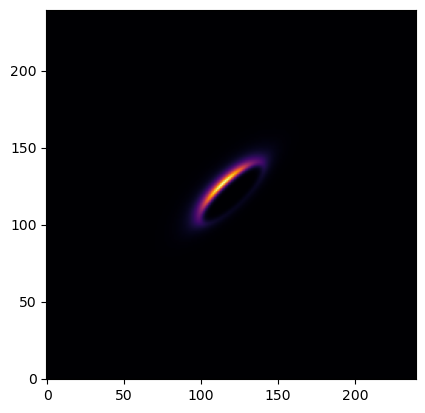

In [11]:
plt.imshow(opt.get_disk(), cmap='inferno', origin='lower')

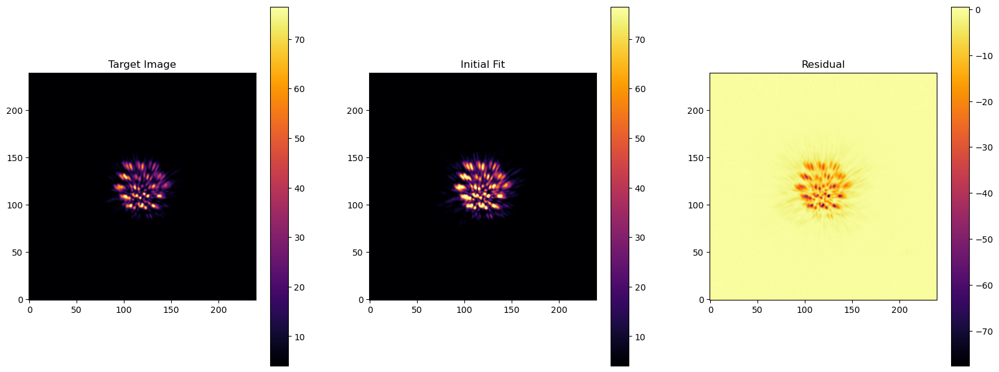

In [12]:
fig, axes = plt.subplots(1,3, figsize=(20,10))
init_image = opt.get_model()

mask = OptimizeUtils.get_mask(target_image)
vmin = np.nanpercentile(target_image[mask], 1)
vmax = np.nanpercentile(target_image[mask], 99)

im = axes[0].imshow(target_image, origin='lower', cmap='inferno')
axes[0].set_title("Target Image")
plt.colorbar(im, ax=axes[0], shrink=0.75)
im.set_clim(vmin, vmax)

im = axes[1].imshow(init_image, origin='lower', cmap='inferno')
axes[1].set_title("Initial Fit")
plt.colorbar(im, ax=axes[1], shrink=0.75)
im.set_clim(vmin, vmax)

im = axes[2].imshow(target_image-init_image, origin='lower', cmap='inferno')
axes[2].set_title("Residual")
plt.colorbar(im, ax=axes[2], shrink=0.75)
# im.set_clim(vmin, vmax)

In [13]:
opt.print_params()

Disk Params: {'accuracy': 0.005, 'alpha_in': 11.99, 'alpha_out': -4.25, 'sma': 70.12, 'e': 0.0, 'ksi0': 3.0, 'gamma': 1.11, 'beta': 1.0, 'rmin': 0.0, 'dens_at_r0': 1.0, 'inclination': 72.4, 'position_angle': 133.22, 'x_center': 120.0, 'y_center': 120.0, 'halfNbSlices': 25, 'omega': 0.0}
SPF Params: {'backscatt_bound': Array(-0.95319067, dtype=float64, weak_type=True), 'forwardscatt_bound': Array(0.95319067, dtype=float64, weak_type=True), 'num_knots': 7, 'knot_values': Array([8.64268514, 2.90095009, 1.55257508, 1.        , 0.71196398,
       0.53980746, 0.42735314], dtype=float64)}
PSF Params: <disk_model.winnie_class.WinniePSF object at 0x7f8fa24ebb10>
Stellar PSF Params: {'stellar_weights': Array([0.004, 0.004, 0.004, 0.004, 0.004, 0.004, 0.004, 0.004, 0.004],      dtype=float64), 'stellar_xs': Array([120., 120., 120., 120., 120., 120., 120., 120., 120.], dtype=float64), 'stellar_ys': Array([120., 120., 120., 120., 120., 120., 120., 120., 120.], dtype=float64)}
Misc Params: {'distanc

In [14]:
# Running optimization method

num_refs = len(image_stack_jax)

fit_keys = ['alpha_in', 'alpha_out', 'sma', 'inclination', 'position_angle', 'x_center', 'y_center', 'knot_values', 'stellar_weights',
            'stellar_xs', 'stellar_ys', 'e']
logscaled_params = ['knot_values', 'stellar_weights']
array_params = ['knot_values', 'stellar_weights', 'stellar_xs', 'stellar_ys']
bounds = ([0.1, -15, 0, 0, 0, 110, 110, np.zeros(7), np.zeros(num_refs), 110*np.ones(num_refs), 110*np.ones(num_refs), 0],
          [200, -0.1, 150, 180, 400, 130, 130, 1e4*np.ones(7), np.ones(num_refs), 130*np.ones(num_refs), 130*np.ones(num_refs), 1])

opt.scipy_bounded_optimize(fit_keys, bounds, logscaled_params, array_params, target_image, err_map, disp_soln=True, iters = 2000, scale_for_shape = True)
optimal_image = opt.get_model()

  message: CONVERGENCE: RELATIVE REDUCTION OF F <= FACTR*EPSMCH
  success: True
   status: 0
      fun: 76.72306490864023
        x: [ 1.199e+01 -4.332e+00 ...  1.200e+02  0.000e+00]
      nit: 95
      jac: [-6.594e-04  4.782e-02 ... -1.649e+00  5.017e-02]
     nfev: 13201
     njev: 307
 hess_inv: <42x42 LbfgsInvHessProduct with dtype=float64>


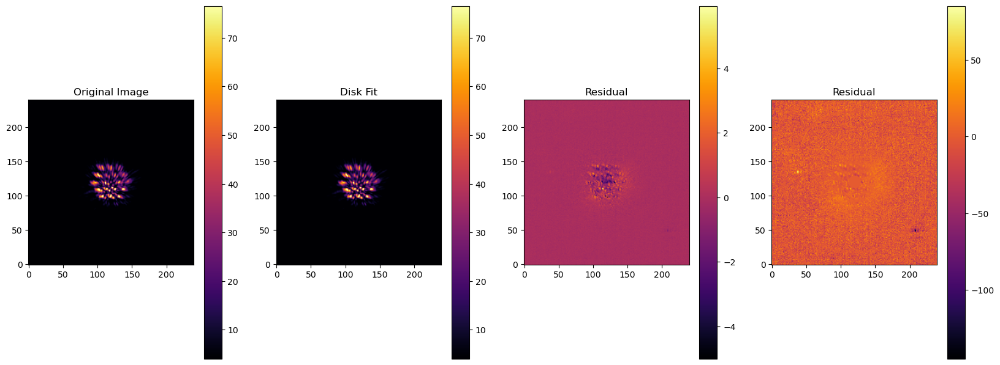

In [15]:
fig, axes = plt.subplots(1,4, figsize=(20,10))

mask = OptimizeUtils.get_mask(target_image)
vmin = np.nanpercentile(target_image[mask], 1)
vmax = np.nanpercentile(target_image[mask], 99)

im = axes[0].imshow(target_image, origin='lower', cmap='inferno')
axes[0].set_title("Original Image")
plt.colorbar(im, ax=axes[0], shrink=0.75)
im.set_clim(vmin, vmax)

im = axes[1].imshow(optimal_image, origin='lower', cmap='inferno')
axes[1].set_title("Disk Fit")
plt.colorbar(im, ax=axes[1], shrink=0.75)
im.set_clim(vmin, vmax)

im = axes[2].imshow(target_image-optimal_image, origin='lower', cmap='inferno')
axes[2].set_title("Residual")
plt.colorbar(im, ax=axes[2], shrink=0.75)
# im.set_clim(vmin, vmax)

im = axes[3].imshow(np.nan_to_num((target_image-optimal_image) / err_map), origin='lower', cmap='inferno')
axes[3].set_title("Residual")
plt.colorbar(im, ax=axes[3], shrink=0.75)
# im.set_clim(vmin, vmax)

In [16]:
#opt.scale_spline_to_fixed_point(0, 1)
opt.print_params()
opt.log_likelihood(target_image, err_map)

Disk Params: {'accuracy': 0.005, 'alpha_in': np.float64(11.991824733285597), 'alpha_out': np.float64(-4.331835755222157), 'sma': np.float64(70.11766119854936), 'e': np.float64(0.0), 'ksi0': 3.0, 'gamma': 1.11, 'beta': 1.0, 'rmin': 0.0, 'dens_at_r0': 1.0, 'inclination': np.float64(72.40051068796352), 'position_angle': np.float64(130.75301896285768), 'x_center': np.float64(120.00550993678145), 'y_center': np.float64(119.9967164574282), 'halfNbSlices': 25, 'omega': 0.0}
SPF Params: {'backscatt_bound': Array(-0.95319067, dtype=float64, weak_type=True), 'forwardscatt_bound': Array(0.95319067, dtype=float64, weak_type=True), 'num_knots': 7, 'knot_values': array([7.89169596, 2.73061047, 1.5329754 , 0.98799104, 0.70939127,
       0.53610068, 0.42588046])}
PSF Params: <disk_model.winnie_class.WinniePSF object at 0x7f8fa24ebb10>
Stellar PSF Params: {'stellar_weights': array([0.00094456, 0.00216458, 0.0051997 , 0.00122355, 0.00083996,
       0.00157298, 0.00342762, 0.00349098, 0.00501899]), 'stel

Array(-4419248.53873768, dtype=float64)

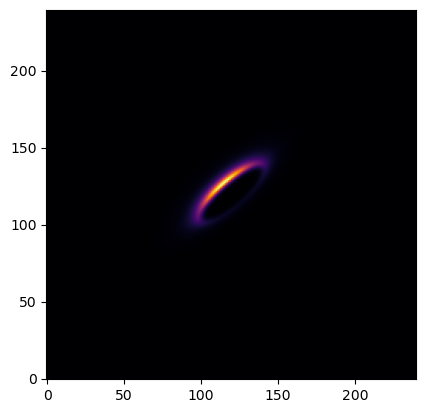

In [17]:
plt.imshow(opt.get_disk(), cmap='inferno', origin='lower')

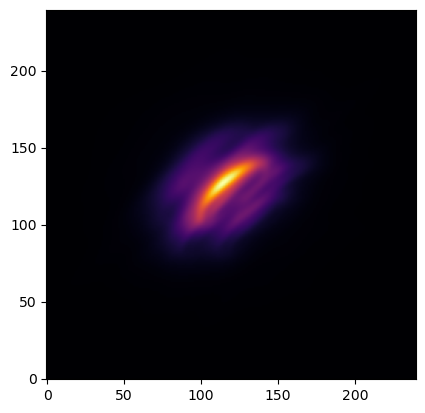

In [18]:
plt.imshow(opt.get_model()-opt.computer_stellar_psf_image(), cmap='inferno', origin='lower')

## Running MCMC

In [19]:
# For MCMC, spline values are log scaled, the optimizer class passes them in as log(spf_params) and they are exponated in the lambda expression, this evens out the markov chains
# helping MCMC work better

# Running optimization method
fit_keys = ['alpha_in', 'alpha_out', 'sma', 'inclination', 'position_angle', 'x_center', 'y_center', 'knot_values', 'stellar_weights',
            'stellar_xs', 'stellar_ys', 'e']
logscaled_params = ['knot_values', 'stellar_weights']
array_params = ['knot_values', 'stellar_weights', 'stellar_xs', 'stellar_ys']
bounds = ([0.1, -15, 0, 0, 0, 110, 110, np.zeros(7), np.zeros(num_refs), 110*np.ones(num_refs), 110*np.ones(num_refs), 0],
          [200, -0.1, 150, 180, 400, 130, 130, 1e4*np.ones(7), np.ones(num_refs), 130*np.ones(num_refs), 130*np.ones(num_refs), 1])

# fit_keys = ['stellar_weights', 'stellar_xs', 'stellar_ys']
# logscaled_params = ['stellar_weights']
# array_params = ['stellar_weights', 'stellar_xs', 'stellar_ys']
# bounds = ([np.zeros(num_refs), 110*np.ones(num_refs), 110*np.ones(num_refs)],
#           [np.ones(num_refs), 130*np.ones(num_refs), 130*np.ones(num_refs)])

mc_model = opt.mcmc(fit_keys, logscaled_params, array_params, target_image, err_map, bounds, nwalkers=100, niter=100, burns=20, scale_for_shape = True)

Overwriting the previous backend...
Running burn-in...


100%|██████████| 20/20 [00:36<00:00,  1.82s/it]


Running production...


100%|██████████| 100/100 [03:19<00:00,  1.99s/it]


In [20]:
mc_soln = np.median(mc_model.sampler.flatchain, axis=0)
img = opt.get_model()

Text(0.5, 1.0, 'Post MCMC')

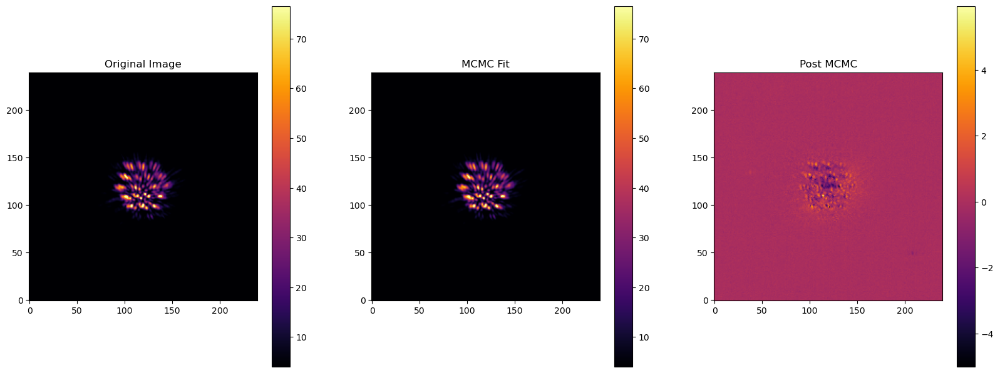

In [21]:
fig, axes = plt.subplots(1,3, figsize=(20,10))

mask = OptimizeUtils.get_mask(target_image)
vmin = np.nanpercentile(target_image[mask], 1)
vmax = np.nanpercentile(target_image[mask], 99)

im = axes[0].imshow(target_image, origin='lower', cmap='inferno')
axes[0].set_title("Original Image")
plt.colorbar(im, ax=axes[0], shrink=0.75)
im.set_clim(vmin, vmax)

im = axes[1].imshow(img, origin='lower', cmap='inferno')
axes[1].set_title("MCMC Fit")
plt.colorbar(im, ax=axes[1], shrink=0.75)
im.set_clim(vmin, vmax)

im = axes[2].imshow(target_image-img, origin='lower', cmap='inferno')
axes[2].set_title("Residual")
plt.colorbar(im, ax=axes[2], shrink=0.75)
# im.set_clim(vmin, vmax)
plt.title("Post MCMC")

### Plotting MCMC Results

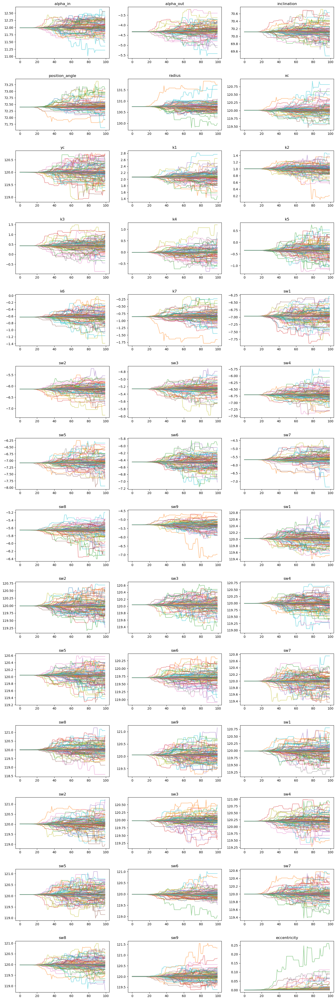

In [22]:
labels = ['alpha_in', 'alpha_out', 'inclination', 'position_angle', 'radius', 'xc', 'yc']
for i in range(0, opt.spf_params['num_knots']):
    labels.append('k'+str(i+1))
for i in range(0, len(opt.stellar_psf_params['stellar_weights'])):
    labels.append('sw'+str(i+1))
for i in range(0, len(opt.stellar_psf_params['stellar_xs'])):
    labels.append('sw'+str(i+1))
for i in range(0, len(opt.stellar_psf_params['stellar_ys'])):
    labels.append('sw'+str(i+1))
labels.append('eccentricity')
mc_model.plot_chains(labels)

In [23]:
mc_model.show_corner_plot(labels, truths=mc_soln)

[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too few points to create valid contours
[      root:WARNING] Too

In [24]:
print(mc_model.get_theta_median())
print(labels)

[ 1.19918530e+01 -4.33182959e+00  7.01176598e+01  7.24005180e+01
  1.30753008e+02  1.20005509e+02  1.19996719e+02  2.06580643e+00
  1.00452164e+00  4.27209310e-01 -1.20951182e-02 -3.43341657e-01
 -6.23430977e-01 -8.53599128e-01 -6.96479008e+00 -6.13552589e+00
 -5.25915590e+00 -6.70599279e+00 -7.08215386e+00 -6.45478011e+00
 -5.67589981e+00 -5.65757291e+00 -5.29454330e+00  1.20020547e+02
  1.19991618e+02  1.20041070e+02  1.19993868e+02  1.20043602e+02
  1.19705932e+02  1.19999941e+02  1.20000001e+02  1.20052120e+02
  1.19986427e+02  1.20007539e+02  1.19977523e+02  1.20201379e+02
  1.20060225e+02  1.19986940e+02  1.19999880e+02  1.19977134e+02
  1.19999980e+02  2.41435326e-05]
['alpha_in', 'alpha_out', 'inclination', 'position_angle', 'radius', 'xc', 'yc', 'k1', 'k2', 'k3', 'k4', 'k5', 'k6', 'k7', 'sw1', 'sw2', 'sw3', 'sw4', 'sw5', 'sw6', 'sw7', 'sw8', 'sw9', 'sw1', 'sw2', 'sw3', 'sw4', 'sw5', 'sw6', 'sw7', 'sw8', 'sw9', 'sw1', 'sw2', 'sw3', 'sw4', 'sw5', 'sw6', 'sw7', 'sw8', 'sw9', 'ecc